<a href="https://colab.research.google.com/github/ABHIRAM199/MY-ML-Projects/blob/main/Satellite_Image_Classification_Using_Deep_Learning_ABHIRAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Satellite Image Classification Using Deep Learning

In this project, I focused on the classification of satellite images for remote sensing, leveraging deep learning techniques to analyze and classify satellite data into various classes. The dataset I used consists of satellite images collected from multiple reliable sources like NASA Earth Data, USGS Earth Explorer, Sentinel Hub, and Google Earth Engine (GEE). These sources offer a wide range of satellite imagery, covering geographical, temporal, and spectral aspects, enabling precise analysis.

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import numpy as np  # Import numpy library for numerical operations
import pandas as pd  # Import pandas library for data manipulation and analysis
import seaborn as sns  # Import seaborn library for data visualization

In [3]:
import os

#Specify the path to your dataset in Google Drive
# Replace 'MyDrive/dataset_folder' with your actual Google Drive folder path
dataset_path = '/content/drive/MyDrive/Remote Sensing Data/'

# Step 3: Iterate through files in the specified Google Drive path
for dirname, _, filenames in os.walk(dataset_path):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/content/drive/MyDrive/Remote Sensing Data/data.yaml
/content/drive/MyDrive/Remote Sensing Data/README.roboflow.txt
/content/drive/MyDrive/Remote Sensing Data/README.dataset.txt
/content/drive/MyDrive/Remote Sensing Data/valid/images/760_jpg.rf.8ebb9e21e1b090a2163b5d2c28856926.jpg
/content/drive/MyDrive/Remote Sensing Data/valid/images/522_jpg.rf.f2a9ce8fb251c1105c444263660b5ba5.jpg
/content/drive/MyDrive/Remote Sensing Data/valid/images/618_jpg.rf.8c86b9102d8dd8199607f2ce9c953554.jpg
/content/drive/MyDrive/Remote Sensing Data/valid/images/325_jpg.rf.5104a35fdfcb7aec41e39cb86d3ea070.jpg
/content/drive/MyDrive/Remote Sensing Data/valid/images/444_jpg.rf.3491e6297d7382d8fb48a5e100ef4d50.jpg
/content/drive/MyDrive/Remote Sensing Data/valid/images/775_jpg.rf.b5abf77d77ef06440d2273e049438555.jpg
/content/drive/MyDrive/Remote Sensing Data/valid/images/428_jpg.rf.c9b53138a175da8639c3af231d9c7f23.jpg
/content/drive/MyDrive/Remote Sensing Data/valid/images/693_jpg.rf.a210ec61d48968fc7623c23629f

In [4]:
image_dir = '/content/drive/MyDrive/Remote Sensing Data/train/images'
label_dir = '/content/drive/MyDrive/Remote Sensing Data/train/labels'

In [5]:
image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')])
label_files = sorted([f for f in os.listdir(label_dir) if f.endswith('.txt')])

In [6]:
image_paths = []
class_labels = []
center_x = []
center_y = []
width = []
height = []

for img, lbl in zip(image_files, label_files):

    img_path = os.path.join(image_dir, img)
    label_path = os.path.join(label_dir, lbl)

    with open(label_path, 'r') as file:
        for line in file:

            parts = line.strip().split()
            if len(parts) == 5:

                image_paths.append(img_path)
                class_labels.append(int(parts[0]))
                center_x.append(float(parts[1]))
                center_y.append(float(parts[2]))
                width.append(float(parts[3]))
                height.append(float(parts[4]))

df = pd.DataFrame({
    'image_path': image_paths,
    'class_label': class_labels,
    'center_x': center_x,
    'center_y': center_y,
    'width': width,
    'height': height
})

In [34]:
df.head()

,image_path,class_label,center_x,center_y,width,height
0,/content/drive/MyDrive/Remote Sensing Data/tra...,2,0.498437,0.498437,0.996094,0.996094
1,/content/drive/MyDrive/Remote Sensing Data/tra...,10,0.510938,0.618750,0.970313,0.754687
2,/content/drive/MyDrive/Remote Sensing Data/tra...,9,0.498437,0.498437,0.996094,0.996094
3,/content/drive/MyDrive/Remote Sensing Data/tra...,4,0.498437,0.498437,0.996094,0.996094
4,/content/drive/MyDrive/Remote Sensing Data/tra...,5,0.498437,0.498437,0.996094,0.996094


In [35]:
df.tail()

,image_path,class_label,center_x,center_y,width,height
743,/content/drive/MyDrive/Remote Sensing Data/tra...,7,0.498437,0.498437,0.996094,0.996094
744,/content/drive/MyDrive/Remote Sensing Data/tra...,3,0.498437,0.498437,0.996094,0.996094
745,/content/drive/MyDrive/Remote Sensing Data/tra...,2,0.498437,0.498437,0.996094,0.996094
746,/content/drive/MyDrive/Remote Sensing Data/tra...,3,0.182031,0.498437,0.364063,0.996094
747,/content/drive/MyDrive/Remote Sensing Data/tra...,11,0.662500,0.498437,0.667969,0.996094


In [36]:
df.shape

(748, 6)

In [37]:
df.columns

Index(['image_path', 'class_label', 'center_x', 'center_y', 'width', 'height'], dtype='object')

In [38]:
df.duplicated().sum()

np.int64(0)

In [39]:
df.isnull().sum()

,0
image_path,0
class_label,0
center_x,0
center_y,0
width,0
height,0


In [40]:
df = df[['image_path', 'class_label']]

In [41]:
df

,image_path,class_label
0,/content/drive/MyDrive/Remote Sensing Data/tra...,2
1,/content/drive/MyDrive/Remote Sensing Data/tra...,10
2,/content/drive/MyDrive/Remote Sensing Data/tra...,9
3,/content/drive/MyDrive/Remote Sensing Data/tra...,4
4,/content/drive/MyDrive/Remote Sensing Data/tra...,5
...,...,...
743,/content/drive/MyDrive/Remote Sensing Data/tra...,7
744,/content/drive/MyDrive/Remote Sensing Data/tra...,3
745,/content/drive/MyDrive/Remote Sensing Data/tra...,2
746,/content/drive/MyDrive/Remote Sensing Data/tra...,3


<ipython-input-7-5f2377650737>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df, x='class_label', palette="viridis")


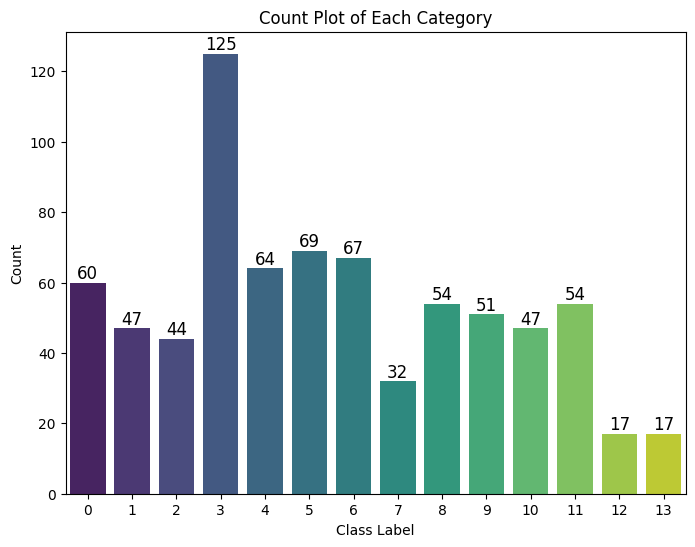

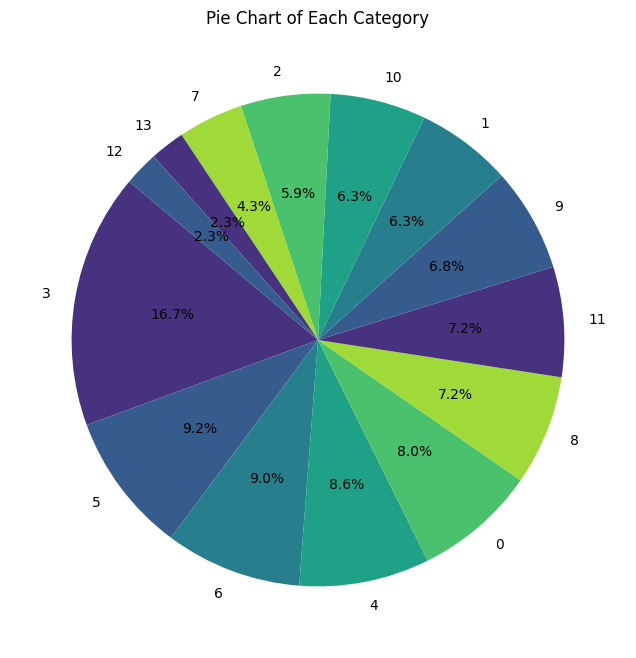

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
ax = sns.countplot(data=df, x='class_label', palette="viridis")
plt.title('Count Plot of Each Category')
plt.xlabel('Class Label')
plt.ylabel('Count')


for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=12, color='black')

plt.show()

plt.figure(figsize=(8, 8))
class_counts = df['class_label'].value_counts()
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', colors=sns.color_palette("viridis"), startangle=140)

plt.title('Pie Chart of Each Category')
plt.show()

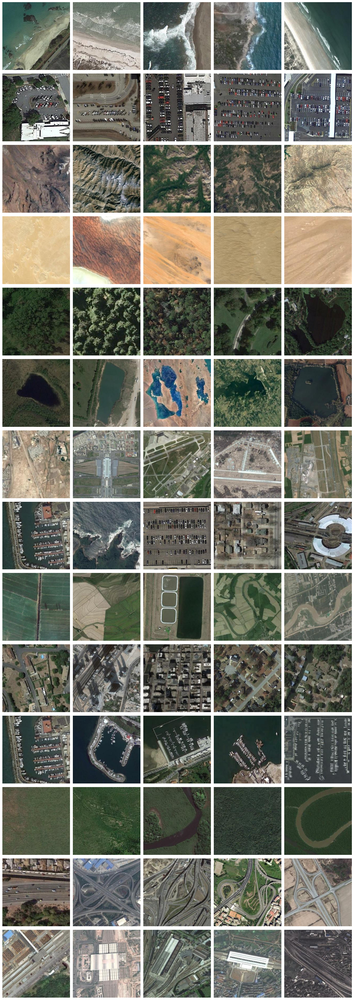

In [8]:
import random
from PIL import Image

images_per_category = 5

class_labels = df['class_label'].unique()

fig, axes = plt.subplots(len(class_labels), images_per_category, figsize=(15, 3 * len(class_labels)))

for i, class_label in enumerate(class_labels):

    class_images = df[df['class_label'] == class_label]['image_path'].tolist()

    sampled_images = random.sample(class_images, min(images_per_category, len(class_images)))

    for j, image_path in enumerate(sampled_images):
        img = Image.open(image_path)

        axes[i, j].imshow(img)
        axes[i, j].axis('off')

        if j == 0:
            axes[i, j].set_ylabel(f"Class {class_label}", rotation=0, labelpad=50, fontsize=12, ha='right', va='center')

plt.tight_layout()
plt.show()

In [9]:
from imblearn.over_sampling import RandomOverSampler

In [10]:
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(df[['image_path']], df['class_label'])

In [11]:
df_resampled = pd.DataFrame(X_resampled, columns=['image_path'])
df_resampled['class_label'] = y_resampled

In [12]:
print("\nClass distribution after oversampling:")
print(df_resampled['class_label'].value_counts())


Class distribution after oversampling:
class_label
2     125
10    125
9     125
4     125
5     125
8     125
1     125
13    125
0     125
3     125
11    125
6     125
7     125
12    125
Name: count, dtype: int64


In [48]:
df_resampled

,image_path,class_label
0,/content/drive/MyDrive/Remote Sensing Data/tra...,2
1,/content/drive/MyDrive/Remote Sensing Data/tra...,10
2,/content/drive/MyDrive/Remote Sensing Data/tra...,9
3,/content/drive/MyDrive/Remote Sensing Data/tra...,4
4,/content/drive/MyDrive/Remote Sensing Data/tra...,5
...,...,...
1745,/content/drive/MyDrive/Remote Sensing Data/tra...,13
1746,/content/drive/MyDrive/Remote Sensing Data/tra...,13
1747,/content/drive/MyDrive/Remote Sensing Data/tra...,13
1748,/content/drive/MyDrive/Remote Sensing Data/tra...,13


In [13]:
import time
import shutil
import pathlib
import itertools
from PIL import Image

import cv2
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers

import warnings
warnings.filterwarnings("ignore")

print ('check')

check


In [14]:
df_resampled['class_label'] = df_resampled['class_label'].astype(str)

In [15]:
train_df_new, temp_df_new = train_test_split(
    df_resampled,
    train_size=0.8,
    shuffle=True,
    random_state=42,
    stratify=df_resampled['class_label']
)

valid_df_new, test_df_new = train_test_split(
    temp_df_new,
    test_size=0.5,
    shuffle=True,
    random_state=42,
    stratify=temp_df_new['class_label']
)

In [16]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

batch_size = 16
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

tr_gen = ImageDataGenerator(rescale=1./255)
ts_gen = ImageDataGenerator(rescale=1./255)

train_gen_new = tr_gen.flow_from_dataframe(
    train_df_new,
    x_col='image_path',
    y_col='class_label',
    target_size=img_size,
    class_mode='sparse',
    color_mode='rgb',
    shuffle=True,
    batch_size=batch_size
)

valid_gen_new = ts_gen.flow_from_dataframe(
    valid_df_new,
    x_col='image_path',
    y_col='class_label',
    target_size=img_size,
    class_mode='sparse',
    color_mode='rgb',
    shuffle=True,
    batch_size=batch_size
)

test_gen_new = ts_gen.flow_from_dataframe(
    test_df_new,
    x_col='image_path',
    y_col='class_label',
    target_size=img_size,
    class_mode='sparse',
    color_mode='rgb',
    shuffle=False,
    batch_size=batch_size
)

Found 1400 validated image filenames belonging to 14 classes.
Found 175 validated image filenames belonging to 14 classes.
Found 175 validated image filenames belonging to 14 classes.


In [17]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [18]:
physical_devices = tf.config.list_physical_devices('GPU')
if physical_devices:
    print("Using GPU")
else:
    print("Using CPU")

Using GPU


In [18]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [56]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization, GaussianNoise, Input, MultiHeadAttention, Reshape
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

def create_vgg16_model(input_shape):

    inputs = Input(shape=input_shape)

    base_model = VGG16(weights='imagenet', input_tensor=inputs, include_top=False)

    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output

    height, width, channels = 7, 7, 512
    x = Reshape((height * width, channels))(x)

    attention_output = MultiHeadAttention(num_heads=8, key_dim=channels)(x, x)

    attention_output = Reshape((height, width, channels))(attention_output)

    x = GaussianNoise(0.25)(attention_output)
    x = GlobalAveragePooling2D()(x)

    x = Dense(512, activation='relu')(x)
    x = BatchNormalization()(x)
    x = GaussianNoise(0.25)(x)
    x = Dropout(0.25)(x)

    outputs = Dense(14, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)

    return model

input_shape = (224, 224, 3)
cnn_model = create_vgg16_model(input_shape)

cnn_model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

In [57]:
history = cnn_model.fit(
    train_gen_new,
    validation_data=valid_gen_new,
    epochs=20,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 45s 333ms/step - accuracy: 0.3590 - loss: 2.0386 - val_accuracy: 0.4971 - val_loss: 2.2916
Epoch 2/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 136ms/step - accuracy: 0.6038 - loss: 1.2130 - val_accuracy: 0.5143 - val_loss: 1.9857
Epoch 3/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 137ms/step - accuracy: 0.7359 - loss: 0.8921 - val_accuracy: 0.6857 - val_loss: 1.5200
Epoch 4/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 20s 136ms/step - accuracy: 0.7679 - loss: 0.7471 - val_accuracy: 0.7143 - val_loss: 1.1551
Epoch 5/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 136ms/step - accuracy: 0.7859 - loss: 0.6761 - val_accuracy: 0.6571 - val_loss: 1.1869
Epoch 6/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 137ms/step - accuracy: 0.8306 - loss: 0.5936 - val_accuracy: 0.6400 - val_loss: 1.1231
Epoch 7/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 21s 141ms/step - accuracy: 0.8416 - loss: 0.5232 - val_accuracy: 0.7943 - val_loss: 0.9124
Epoch 8/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - accuracy: 0.8509 - loss: 0.4474 - val_accu

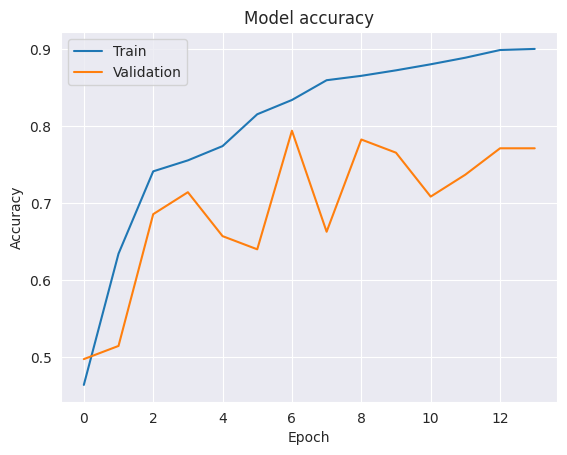

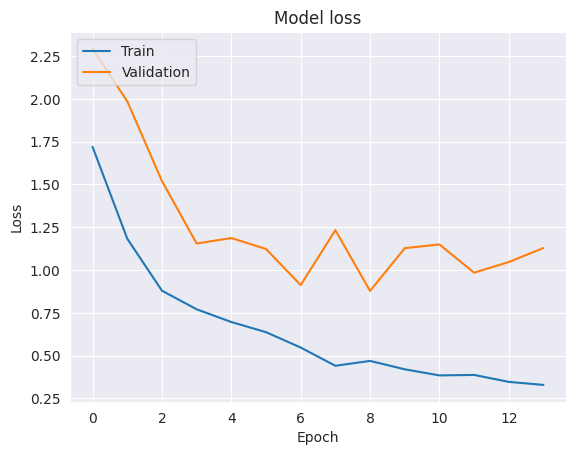

In [58]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [59]:
test_labels = test_gen_new.classes
predictions = cnn_model.predict(test_gen_new)
predicted_classes = np.argmax(predictions, axis=1)

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step


In [60]:
report = classification_report(test_labels, predicted_classes, target_names=list(test_gen_new.class_indices.keys()))
print(report)

              precision    recall  f1-score   support

           0       0.77      0.83      0.80        12
           1       1.00      0.77      0.87        13
          10       0.79      0.92      0.85        12
          11       1.00      0.62      0.76        13
          12       1.00      0.85      0.92        13
          13       0.38      1.00      0.55        12
           2       0.93      1.00      0.96        13
           3       0.80      0.31      0.44        13
           4       0.69      0.75      0.72        12
           5       0.88      0.58      0.70        12
           6       0.86      0.46      0.60        13
           7       0.80      1.00      0.89        12
           8       0.62      0.42      0.50        12
           9       0.76      1.00      0.87        13

    accuracy                           0.75       175
   macro avg       0.81      0.75      0.74       175
weighted avg       0.81      0.75      0.75       175



In [61]:
conf_matrix = confusion_matrix(test_labels, predicted_classes)

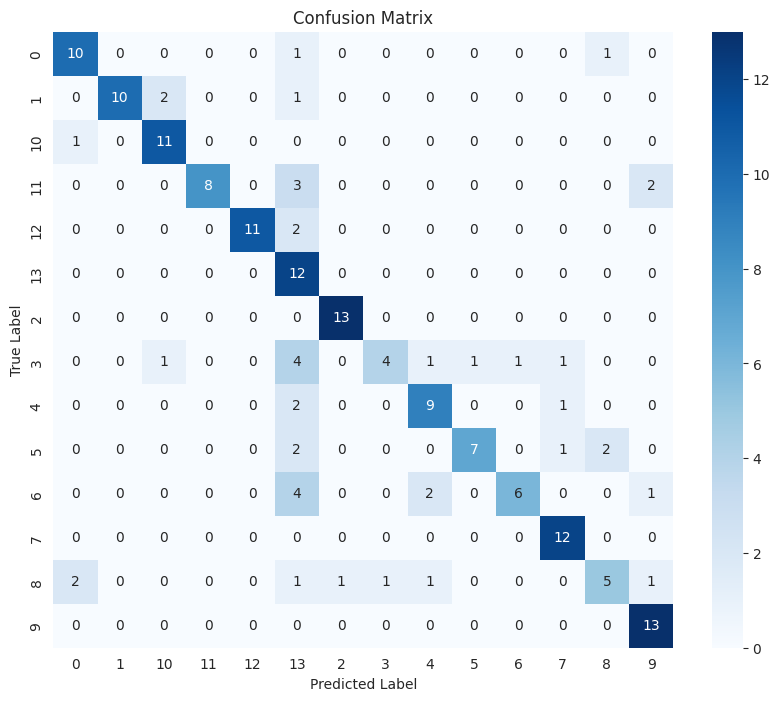

In [62]:
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=list(test_gen_new.class_indices.keys()), yticklabels=list(test_gen_new.class_indices.keys()))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [63]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization, GaussianNoise, Input, MultiHeadAttention, Reshape
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

def create_vgg19_model(input_shape):

    inputs = Input(shape=input_shape)

    base_model = VGG19(weights='imagenet', input_tensor=inputs, include_top=False)

    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output

    height, width, channels = 7, 7, 512
    x = Reshape((height * width, channels))(x)

    attention_output = MultiHeadAttention(num_heads=8, key_dim=channels)(x, x)

    attention_output = Reshape((height, width, channels))(attention_output)

    x = GaussianNoise(0.25)(attention_output)
    x = GlobalAveragePooling2D()(x)

    x = Dense(512, activation='relu')(x)
    x = BatchNormalization()(x)
    x = GaussianNoise(0.25)(x)
    x = Dropout(0.25)(x)

    outputs = Dense(14, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)

    return model

input_shape = (224, 224, 3)
cnn_model = create_vgg19_model(input_shape)

cnn_model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

In [64]:
history = cnn_model.fit(
    train_gen_new,
    validation_data=valid_gen_new,
    epochs=20,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 31s 255ms/step - accuracy: 0.3279 - loss: 2.1754 - val_accuracy: 0.4457 - val_loss: 2.3223
Epoch 2/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 15s 167ms/step - accuracy: 0.5899 - loss: 1.2826 - val_accuracy: 0.4571 - val_loss: 2.0378
Epoch 3/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - accuracy: 0.6691 - loss: 1.0412 - val_accuracy: 0.4686 - val_loss: 1.7139
Epoch 4/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - accuracy: 0.7298 - loss: 0.8769 - val_accuracy: 0.5829 - val_loss: 1.2572
Epoch 5/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - accuracy: 0.7880 - loss: 0.7336 - val_accuracy: 0.6171 - val_loss: 1.0857
Epoch 6/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - accuracy: 0.8341 - loss: 0.5636 - val_accuracy: 0.6571 - val_loss: 1.1573
Epoch 7/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - accuracy: 0.8280 - loss: 0.5357 - val_accuracy: 0.6000 - val_loss: 1.7952
Epoch 8/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - accuracy: 0.8547 - loss: 0.4591 - val_accu

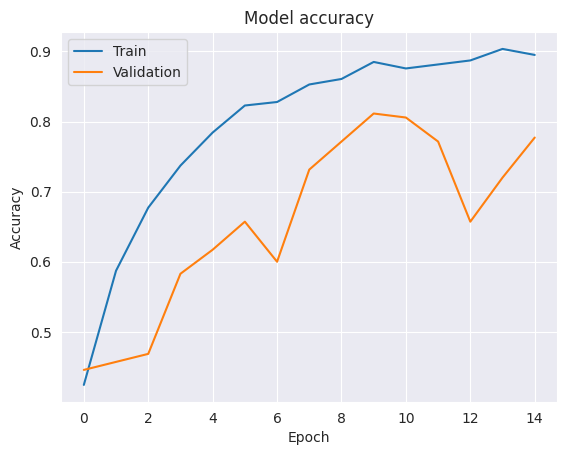

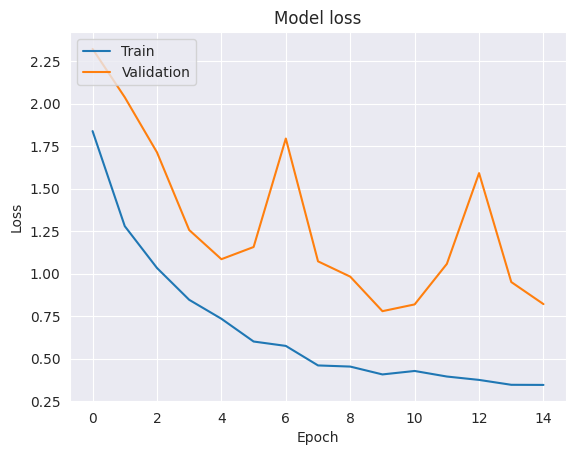

In [65]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [66]:
test_labels = test_gen_new.classes
predictions = cnn_model.predict(test_gen_new)
predicted_classes = np.argmax(predictions, axis=1)

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 213ms/step


In [67]:
report = classification_report(test_labels, predicted_classes, target_names=list(test_gen_new.class_indices.keys()))
print(report)

              precision    recall  f1-score   support

           0       0.73      0.67      0.70        12
           1       0.69      0.85      0.76        13
          10       0.67      0.83      0.74        12
          11       0.83      0.77      0.80        13
          12       1.00      0.77      0.87        13
          13       0.53      0.75      0.62        12
           2       0.93      1.00      0.96        13
           3       0.88      0.54      0.67        13
           4       0.64      0.75      0.69        12
           5       0.56      0.83      0.67        12
           6       1.00      0.54      0.70        13
           7       0.92      0.92      0.92        12
           8       0.78      0.58      0.67        12
           9       0.83      0.77      0.80        13

    accuracy                           0.75       175
   macro avg       0.78      0.75      0.75       175
weighted avg       0.79      0.75      0.76       175



In [68]:
conf_matrix = confusion_matrix(test_labels, predicted_classes)

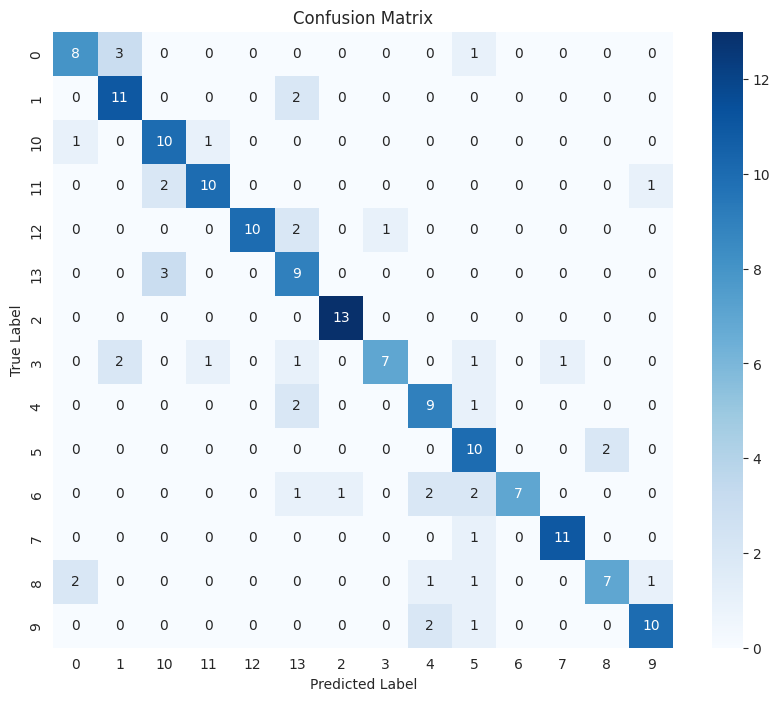

In [69]:
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=list(test_gen_new.class_indices.keys()), yticklabels=list(test_gen_new.class_indices.keys()))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [20]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization, GaussianNoise, Input, MultiHeadAttention, Reshape
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

def create_inceptionv3_model(input_shape):

    inputs = Input(shape=input_shape)

    base_model = InceptionV3(weights='imagenet', input_tensor=inputs, include_top=False)

    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output

    height, width, channels = 5, 5, 2048
    x = Reshape((height * width, channels))(x)

    attention_output = MultiHeadAttention(num_heads=8, key_dim=channels)(x, x)

    attention_output = Reshape((height, width, channels))(attention_output)

    x = GaussianNoise(0.25)(attention_output)
    x = GlobalAveragePooling2D()(x)

    x = Dense(512, activation='relu')(x)
    x = BatchNormalization()(x)
    x = GaussianNoise(0.25)(x)
    x = Dropout(0.25)(x)

    outputs = Dense(14, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)

    return model

input_shape = (224, 224, 3)
cnn_model = create_inceptionv3_model(input_shape)

cnn_model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

In [21]:
history = cnn_model.fit(
    train_gen_new,
    validation_data=valid_gen_new,
    epochs=20,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 80s 629ms/step - accuracy: 0.5061 - loss: 1.7403 - val_accuracy: 0.3086 - val_loss: 2.7899
Epoch 2/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 27s 309ms/step - accuracy: 0.7946 - loss: 0.7216 - val_accuracy: 0.6571 - val_loss: 1.4329
Epoch 3/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 28s 315ms/step - accuracy: 0.8784 - loss: 0.4571 - val_accuracy: 0.5029 - val_loss: 2.2895
Epoch 4/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 26s 300ms/step - accuracy: 0.8849 - loss: 0.4197 - val_accuracy: 0.5257 - val_loss: 3.3310
Epoch 5/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 26s 300ms/step - accuracy: 0.8837 - loss: 0.4565 - val_accuracy: 0.6000 - val_loss: 1.7409
Epoch 6/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 27s 307ms/step - accuracy: 0.9215 - loss: 0.3709 - val_accuracy: 0.7486 - val_loss: 0.9813
Epoch 7/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 26s 299ms/step - accuracy: 0.9062 - loss: 0.3701 - val_accuracy: 0.7143 - val_loss: 1.4329
Epoch 8/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 27s 308ms/step - accuracy: 0.9246 - loss: 0.2677 - val_accu

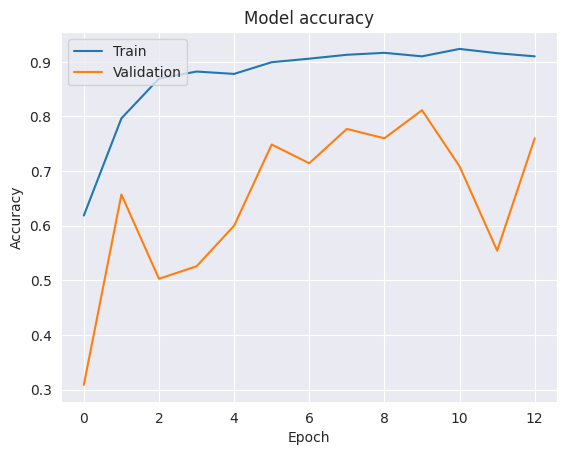

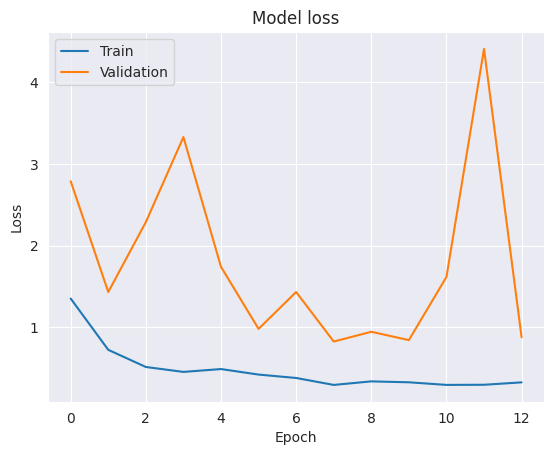

In [22]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [23]:
test_labels = test_gen_new.classes
predictions = cnn_model.predict(test_gen_new)
predicted_classes = np.argmax(predictions, axis=1)

11/11 ━━━━━━━━━━━━━━━━━━━━ 14s 679ms/step


In [24]:
report = classification_report(test_labels, predicted_classes, target_names=list(test_gen_new.class_indices.keys()))
print(report)

              precision    recall  f1-score   support

           0       0.77      0.83      0.80        12
           1       0.67      0.77      0.71        13
          10       0.61      0.92      0.73        12
          11       1.00      0.46      0.63        13
          12       1.00      1.00      1.00        13
          13       0.92      1.00      0.96        12
           2       1.00      0.85      0.92        13
           3       1.00      0.38      0.56        13
           4       0.50      0.83      0.62        12
           5       0.75      0.25      0.38        12
           6       0.52      0.85      0.65        13
           7       0.80      1.00      0.89        12
           8       0.88      0.58      0.70        12
           9       0.85      0.85      0.85        13

    accuracy                           0.75       175
   macro avg       0.80      0.76      0.74       175
weighted avg       0.81      0.75      0.74       175



In [25]:
conf_matrix = confusion_matrix(test_labels, predicted_classes)

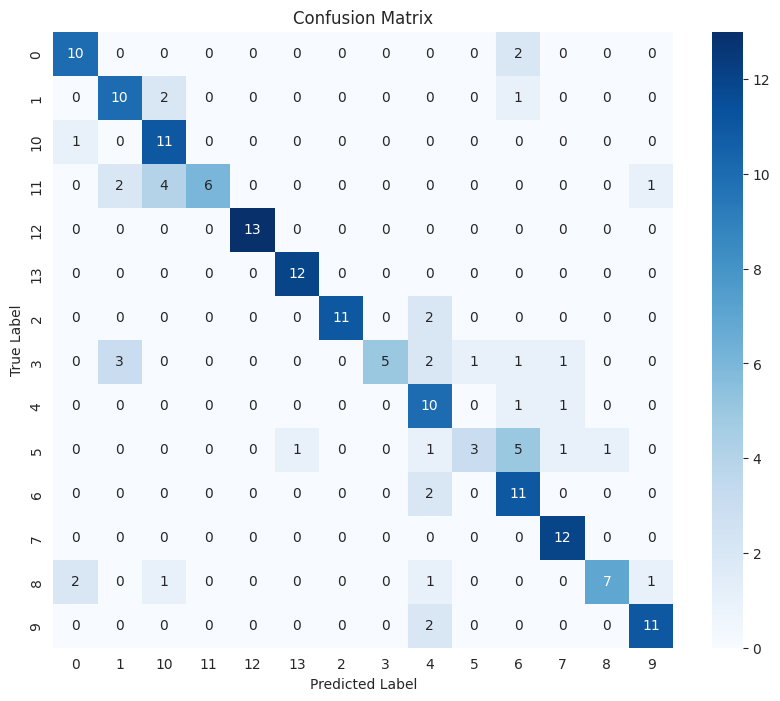

In [26]:
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=list(test_gen_new.class_indices.keys()), yticklabels=list(test_gen_new.class_indices.keys()))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [19]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization, GaussianNoise, Input, MultiHeadAttention, Reshape
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

def create_xception_model(input_shape):

    inputs = Input(shape=input_shape)

    base_model = Xception(weights='imagenet', input_tensor=inputs, include_top=False)

    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output

    height, width, channels = 7, 7, 2048
    x = Reshape((height * width, channels))(x)

    attention_output = MultiHeadAttention(num_heads=8, key_dim=channels)(x, x)

    attention_output = Reshape((height, width, channels))(attention_output)

    x = GaussianNoise(0.25)(attention_output)
    x = GlobalAveragePooling2D()(x)
    x = Dense(512, activation='relu')(x)
    x = BatchNormalization()(x)
    x = GaussianNoise(0.25)(x)
    x = Dropout(0.25)(x)
    outputs = Dense(14, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)

    return model

input_shape = (224, 224, 3)
cnn_model = create_xception_model(input_shape)

cnn_model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

In [20]:
history = cnn_model.fit(
    train_gen_new,
    validation_data=valid_gen_new,
    epochs=20,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 79s 640ms/step - accuracy: 0.5013 - loss: 1.7085 - val_accuracy: 0.6457 - val_loss: 1.2712
Epoch 2/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 34s 390ms/step - accuracy: 0.8144 - loss: 0.6545 - val_accuracy: 0.7257 - val_loss: 1.0590
Epoch 3/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 41s 393ms/step - accuracy: 0.8493 - loss: 0.5698 - val_accuracy: 0.7829 - val_loss: 0.7970
Epoch 4/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 34s 383ms/step - accuracy: 0.8839 - loss: 0.3844 - val_accuracy: 0.7829 - val_loss: 0.8514
Epoch 5/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 34s 390ms/step - accuracy: 0.8989 - loss: 0.3598 - val_accuracy: 0.8114 - val_loss: 0.7912
Epoch 6/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 35s 393ms/step - accuracy: 0.9092 - loss: 0.3055 - val_accuracy: 0.8457 - val_loss: 0.6431
Epoch 7/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 40s 383ms/step - accuracy: 0.8986 - loss: 0.3520 - val_accuracy: 0.7886 - val_loss: 0.9223
Epoch 8/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 34s 383ms/step - accuracy: 0.8997 - loss: 0.3212 - val_accu

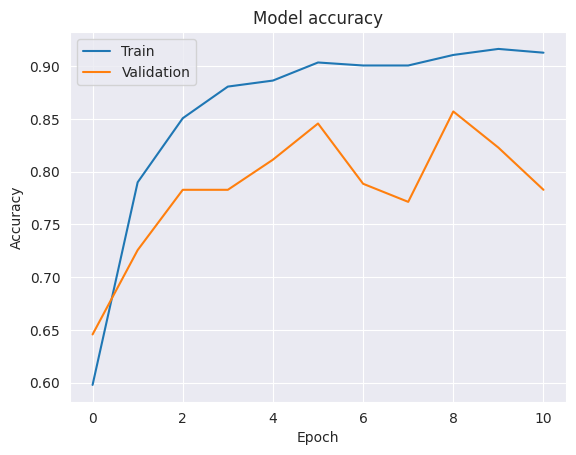

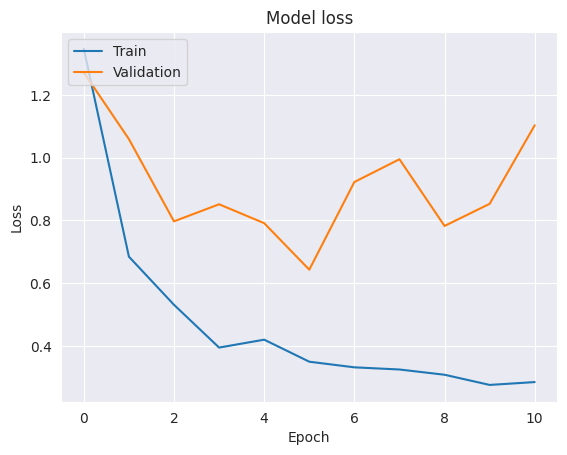

In [21]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [22]:
test_labels = test_gen_new.classes
predictions = cnn_model.predict(test_gen_new)
predicted_classes = np.argmax(predictions, axis=1)

11/11 ━━━━━━━━━━━━━━━━━━━━ 10s 396ms/step


In [23]:
report = classification_report(test_labels, predicted_classes, target_names=list(test_gen_new.class_indices.keys()))
print(report)

              precision    recall  f1-score   support

           0       0.73      0.92      0.81        12
           1       0.79      0.85      0.81        13
          10       1.00      0.92      0.96        12
          11       0.75      0.92      0.83        13
          12       1.00      0.85      0.92        13
          13       0.67      1.00      0.80        12
           2       0.93      1.00      0.96        13
           3       1.00      0.38      0.56        13
           4       0.75      0.75      0.75        12
           5       0.56      0.42      0.48        12
           6       0.79      0.85      0.81        13
           7       0.79      0.92      0.85        12
           8       0.86      0.50      0.63        12
           9       0.73      0.85      0.79        13

    accuracy                           0.79       175
   macro avg       0.81      0.79      0.78       175
weighted avg       0.81      0.79      0.78       175



In [24]:
conf_matrix = confusion_matrix(test_labels, predicted_classes)

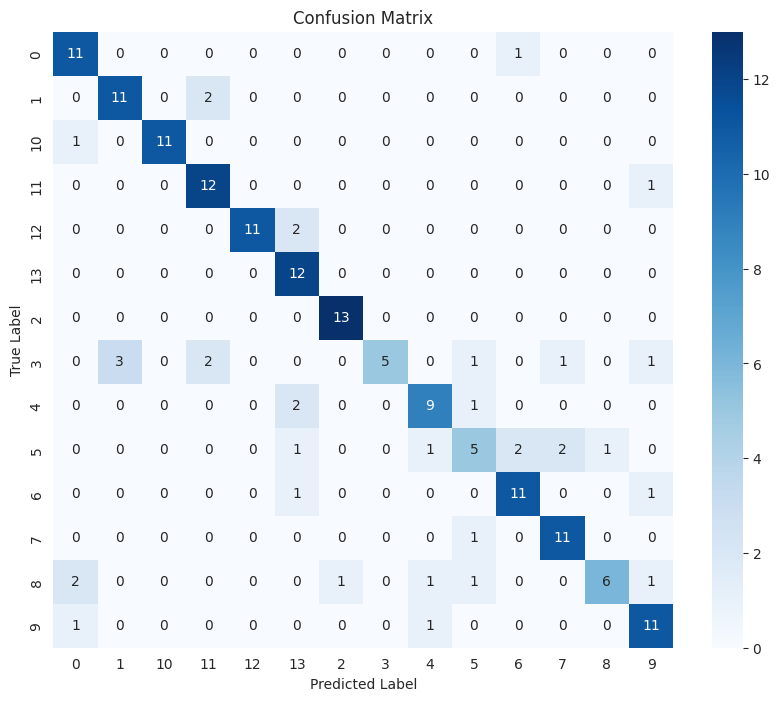

In [25]:
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=list(test_gen_new.class_indices.keys()), yticklabels=list(test_gen_new.class_indices.keys()))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

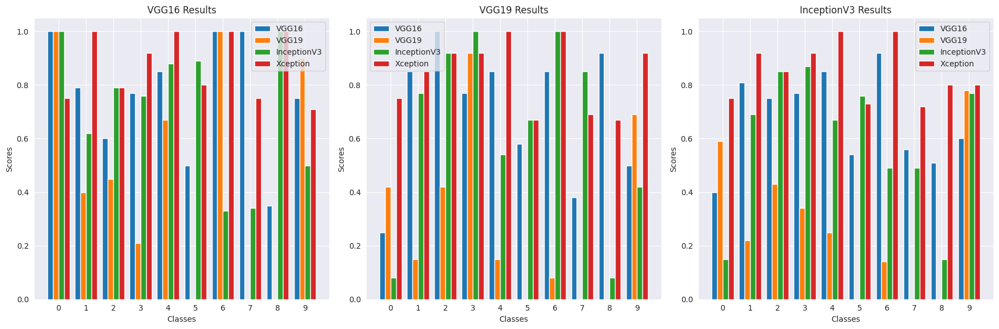

In [26]:
import matplotlib.pyplot as plt
import numpy as np

labels = [str(i) for i in range(10)]

vgg16_precision = [1.00, 0.79, 0.60, 0.77, 0.85, 0.50, 1.00, 1.00, 0.35, 0.75]
vgg16_recall = [0.25, 0.85, 1.00, 0.77, 0.85, 0.58, 0.85, 0.38, 0.92, 0.50]
vgg16_f1 = [0.40, 0.81, 0.75, 0.77, 0.85, 0.54, 0.92, 0.56, 0.51, 0.60]

vgg19_precision = [1.00, 0.40, 0.45, 0.21, 0.67, 0.00, 1.00, 0.00, 0.00, 0.90]
vgg19_recall = [0.42, 0.15, 0.42, 0.92, 0.15, 0.00, 0.08, 0.00, 0.00, 0.69]
vgg19_f1 = [0.59, 0.22, 0.43, 0.34, 0.25, 0.00, 0.14, 0.00, 0.00, 0.78]

inceptionv3_precision = [1.00, 0.62, 0.79, 0.76, 0.88, 0.89, 0.33, 0.34, 1.00, 0.50]
inceptionv3_recall = [0.08, 0.77, 0.92, 1.00, 0.54, 0.67, 1.00, 0.85, 0.08, 0.42]
inceptionv3_f1 = [0.15, 0.69, 0.85, 0.87, 0.67, 0.76, 0.49, 0.49, 0.15, 0.77]

xception_precision = [0.75, 1.00, 0.79, 0.92, 1.00, 0.80, 1.00, 0.75, 1.00, 0.71]
xception_recall = [0.75, 0.85, 0.92, 0.92, 1.00, 0.67, 1.00, 0.69, 0.67, 0.92]
xception_f1 = [0.75, 0.92, 0.85, 0.92, 1.00, 0.73, 1.00, 0.72, 0.80, 0.80]

fig, ax = plt.subplots(1, 3, figsize=(18, 6))

models = ['VGG16', 'VGG19', 'InceptionV3', 'Xception']
precision_data = [vgg16_precision, vgg19_precision, inceptionv3_precision, xception_precision]
recall_data = [vgg16_recall, vgg19_recall, inceptionv3_recall, xception_recall]
f1_data = [vgg16_f1, vgg19_f1, inceptionv3_f1, xception_f1]

x = np.arange(len(labels))
width = 0.2

for i, model in enumerate(models):
    ax[0].bar(x + i * width - 1.5 * width, precision_data[i], width, label=model)

for i, model in enumerate(models):
    ax[1].bar(x + i * width - 1.5 * width, recall_data[i], width, label=model)

for i, model in enumerate(models):
    ax[2].bar(x + i * width - 1.5 * width, f1_data[i], width, label=model)

for i in range(3):
    ax[i].set_xlabel('Classes')
    ax[i].set_ylabel('Scores')
    ax[i].set_title(f'{models[i]} Results')
    ax[i].set_xticks(x)
    ax[i].set_xticklabels(labels)
    ax[i].legend()

plt.tight_layout()
plt.show()